In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import anndata as ad
import scanpy as sc
plt.rcParams['svg.fonttype'] = 'none'

In [2]:
cd /central/groups/mthomson/jialong/single_cell/spin_spatial

/central/groups/mthomson/jialong/single_cell/spin_spatial


In [3]:
cadata = ad.read_h5ad('20230728_breast_cancer_10x/data/adata_combined.h5ad')

/home/jjiang3/miniconda3/envs/scvi/lib/python3.7/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/jjiang3/miniconda3/envs/scvi/lib/python3.7/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [4]:
cadata

AnnData object with n_obs × n_vars = 263903 × 313
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'batch', 'leiden'
    var: 'gene_ENSG', 'gene_name', 'gene_type'
    uns: 'batch_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [5]:
cadata.obsm['spatial'] = np.vstack([cadata.obs['x_centroid'], cadata.obs['y_centroid']]).T

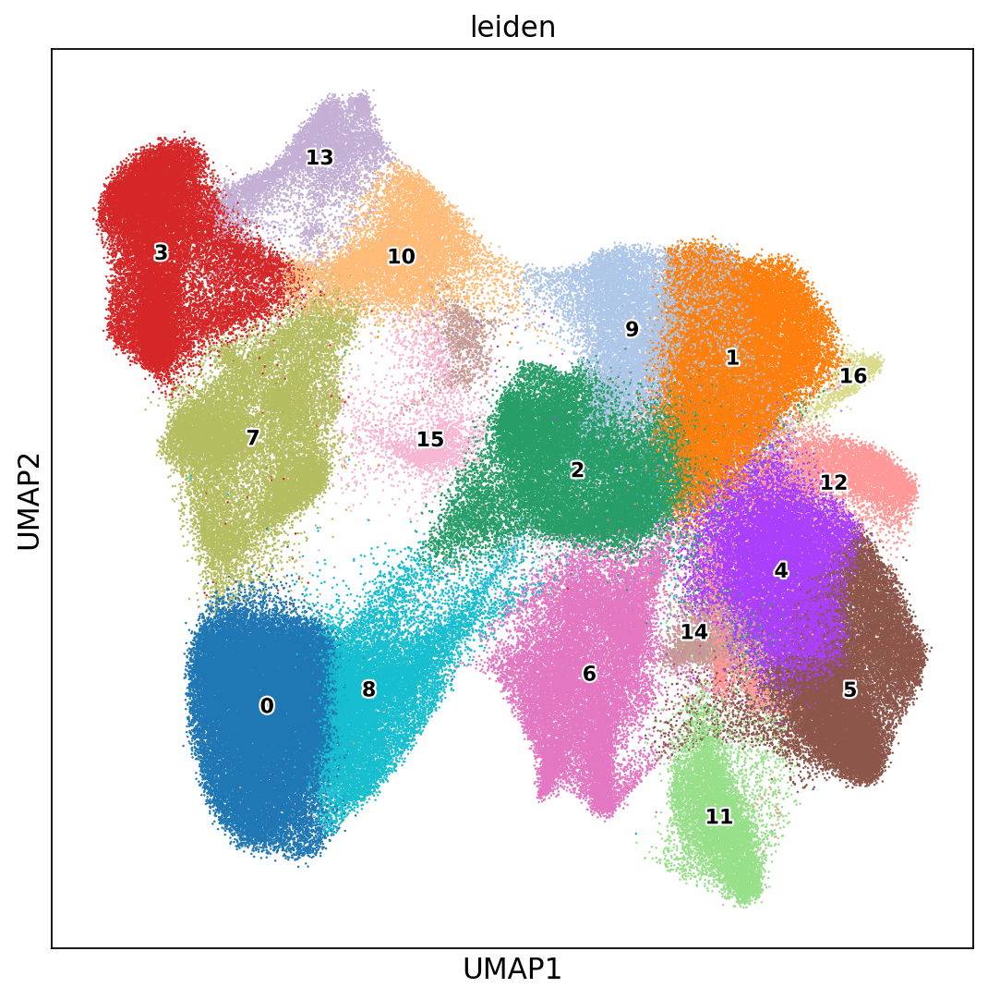

In [6]:
sc.set_figure_params(figsize=[8, 8])

sc.pl.umap(cadata, color=['leiden'], ncols=2, size=5, legend_loc='on data', legend_fontoutline=2, legend_fontsize=10)

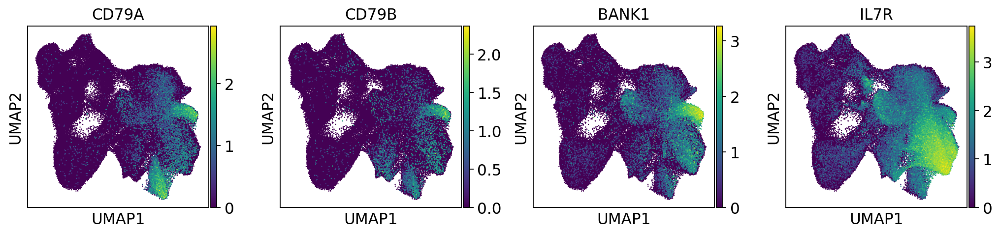

In [71]:
sc.set_figure_params(figsize=[3, 3])

sc.pl.umap(cadata, color=['CD79A', 'CD79B', 'BANK1', 'IL7R'], ncols=8, size=5, legend_loc='on data', legend_fontoutline=10, legend_fontsize=10)

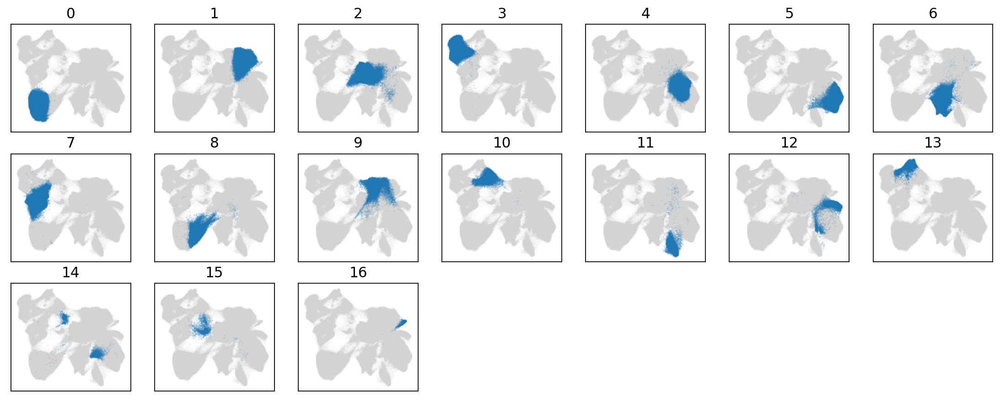

In [8]:
ctype_list = cadata.obs['leiden'].value_counts().keys()
umap_all = cadata.obsm['X_umap']

sc.set_figure_params(figsize=[2, 2])
fig, grid = sc.pl._tools._panel_grid(0.2, 0.2, ncols=7, num_panels=len(ctype_list))

for ii, ctype in enumerate(ctype_list):
    cur_filt = cadata.obs['leiden'] == ctype
    ax = plt.subplot(grid[ii])
    plt.scatter(umap_all[:, 0], umap_all[:, 1], s=0.01, alpha=0.1, c='#d3d3d3')
    scatter = ax.scatter(umap_all[cur_filt, 0], umap_all[cur_filt, 1], s=0.01, alpha=0.5)

    plt.grid()
    plt.xticks([])
    plt.yticks([])
    plt.title(ctype)

<Figure size 601.558x437.354 with 0 Axes>

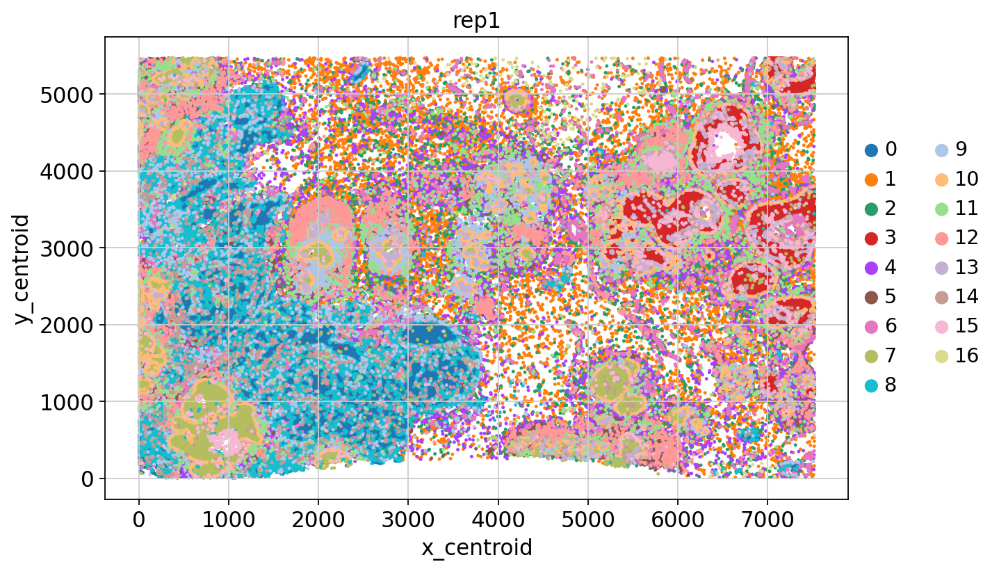

<Figure size 601.452x437.048 with 0 Axes>

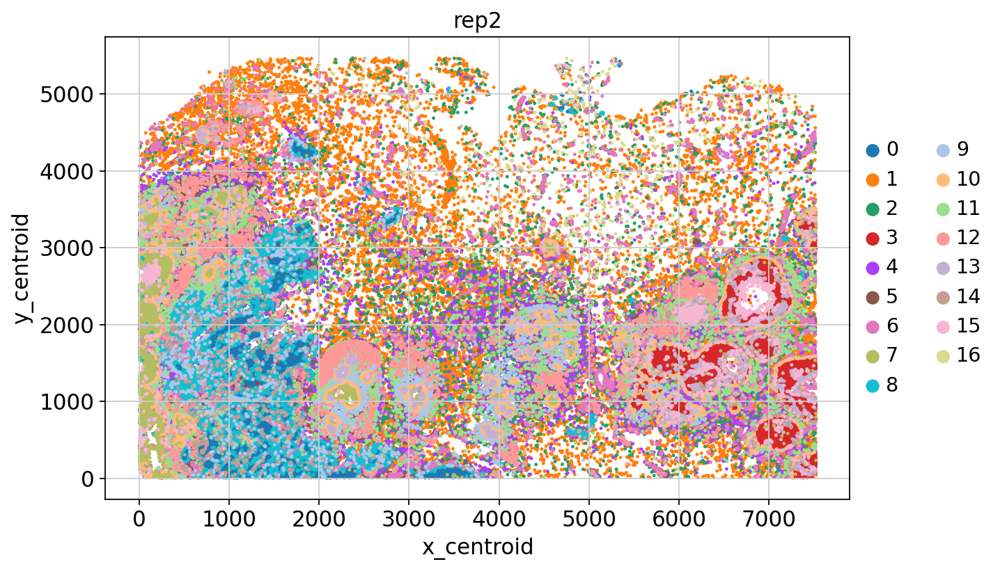

In [10]:
samp_list = ['rep1', 'rep2']

for samp in samp_list:

    cadata_sub = cadata[cadata.obs['batch'] == samp, :]

    cur_spatial_pos = cadata_sub.obsm['spatial']
    xmin, xmax = cur_spatial_pos[:, 0].min(), cur_spatial_pos[:, 0].max()
    ymin, ymax = cur_spatial_pos[:, 1].min(), cur_spatial_pos[:, 1].max()
    xlen, ylen = xmax - xmin, ymax - ymin
    xlen /= 1000
    ylen /= 1000

    sc.set_figure_params(figsize=[xlen, ylen])
    plt.figure()

    
    sc.pl.scatter(cadata_sub, 'x_centroid', 'y_centroid', color='leiden', size=20, title=samp)


In [11]:
num_spin = 30
num_pool = 30
num_repeat = 100

task_name = 'spatial_breast'
folder_name = '20230728_breast_cancer_10x'
data_folder = folder_name + '/data/'
onmf_path = folder_name + '/onmf/'
fig_folder = folder_name + '/figure/'
dspin_folder = folder_name + '/dspin/'

In [12]:
import os
os.mkdir(onmf_path)
# os.mkdir(data_folder)
os.mkdir(fig_folder)
os.mkdir(dspin_folder)

In [14]:
num_total = cadata.obs['total_counts']

cell_filt = num_total > np.median(num_total)
cadata[cell_filt, :]

View of AnnData object with n_obs × n_vars = 131263 × 313
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'batch', 'leiden'
    var: 'gene_ENSG', 'gene_name', 'gene_type'
    uns: 'batch_colors', 'leiden', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [21]:
from scipy.sparse import issparse
from tqdm import tqdm

def prepare_onmf_decomposition(cadata, data_folder, balance_by='leiden', total_sample_size=1e5, method='squareroot'):
    
    if issparse(cadata.X):
        cadata.X = cadata.X.toarray()

    maximum_sample_rate = 2
    cluster_list = list(cadata.obs[balance_by].value_counts().keys())
    cluster_count = list(cadata.obs[balance_by].value_counts())

    if method == 'porpotional':
        weight_fun = cluster_count
    elif method == 'squareroot':
        esti_size = (np.sqrt(cluster_count) / np.sum(np.sqrt(cluster_count)) * total_sample_size).astype(int)
        weight_fun = np.min([esti_size, maximum_sample_rate * np.array(cluster_count)], axis=0)
    elif method == 'equal':
        esti_size = total_sample_size / len(cluster_list)
        weight_fun = np.min([esti_size * np.ones(len(cluster_count)), maximum_sample_rate * np.array(cluster_count)], axis=0)
    sampling_number = (weight_fun / np.sum(weight_fun) * total_sample_size).astype(int)

    gene_matrix_balanced = np.zeros((np.sum(sampling_number), cadata.X.shape[1]))

    for ii in tqdm(range(len(cluster_list))):
        cur_num = sampling_number[ii]
        cur_filt = cadata.obs[balance_by] == cluster_list[ii]
        sele_ind = np.random.choice(np.sum(cur_filt), cur_num)
        strart_ind = np.sum(sampling_number[:ii])
        end_ind = strart_ind + cur_num
        gene_matrix_balanced[strart_ind: end_ind, :] = cadata.X[cur_filt, :][sele_ind, :].toarray()

    matrix_path = data_folder + 'gmatrix_' + '{:.0e}'.format(total_sample_size) + '_balanced_' + method + '.npy'
    np.save(matrix_path, gene_matrix_balanced)

    return matrix_path

In [22]:
# from util.preprocessing import prepare_onmf_decomposition

np.random.seed(0)
matrix_path_ori = prepare_onmf_decomposition(cadata[cell_filt, :], data_folder, balance_by='leiden', total_sample_size=1e5, method='squareroot')
matrix_path_ori

100%|███████████████████████████████████████████| 17/17 [00:01<00:00, 12.87it/s]


'20230728_breast_cancer_10x/data/gmatrix_1e+05_balanced_squareroot.npy'

In [25]:
matrix_path_ori = data_folder + 'gmatrix_1e+05_balanced_squareroot.npy'

In [23]:
matrix_path = matrix_path_ori[: - 4] + '_std.npy'
matrix_path

'20230728_breast_cancer_10x/data/gmatrix_1e+05_balanced_squareroot_std.npy'

(0.0, 1.0)

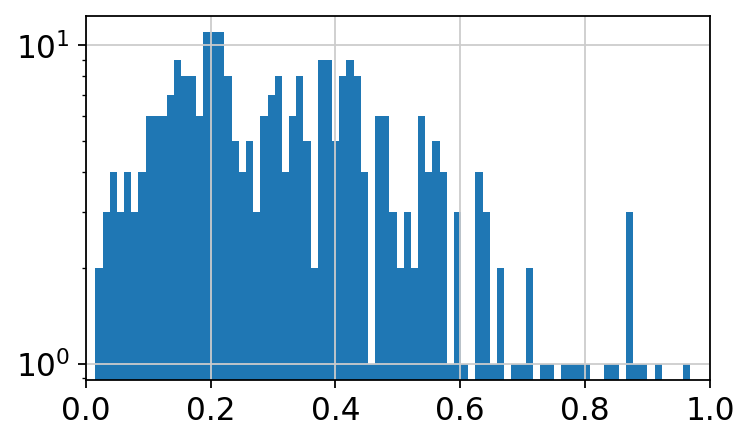

In [24]:
cur_matrix = np.load(matrix_path_ori)

sc.set_figure_params(figsize=[5, 3])
plt.hist(cur_matrix.std(axis=0), bins=100);
plt.yscale('log')
plt.xlim([0, 1])

In [27]:
data_std = cur_matrix.std(axis=0)
cur_matrix /= data_std.clip(np.percentile(data_std, 20), np.inf)
np.save(matrix_path, cur_matrix)

In [28]:
sbatch_path = onmf_path + 'run_%d_%d.sbatch' % (num_pool, num_repeat)

with open(sbatch_path, 'w') as f:
    f.write('''#!/bin/bash
#SBATCH --job-name=python        
#SBATCH --ntasks=1               
#SBATCH --cpus-per-task=2        
#SBATCH --mem-per-cpu=24G         
#SBATCH --time=2:00:00          
#SBATCH --output=python_slurm.out
#SBATCH --error=python_slurm.err
#SBATCH --array=1-%d

source ~/.bashrc
conda activate scvi
cd /central/groups/mthomson/jialong/single_cell/spin_spatial

python compute_onmf_slurm.py %d $SLURM_ARRAY_TASK_ID %s %s
''' % (num_repeat, num_pool, matrix_path, onmf_path))

sbatch_path
os.system('sbatch %s' % sbatch_path)

Submitted batch job 36271267


0

In [75]:
adata_path = '20230728_breast_cancer_10x/data/adata_combined.h5ad'

sbatch_path = onmf_path + 'run_%d_%d.sbatch' % (num_pool, num_repeat)

with open(sbatch_path, 'w') as f:
    f.write('''#!/bin/bash
#SBATCH --job-name=python        
#SBATCH --ntasks=1               
#SBATCH --cpus-per-task=2        
#SBATCH --mem-per-cpu=24G         
#SBATCH --time=2:00:00          
#SBATCH --output=python_slurm.out
#SBATCH --error=python_slurm.err
#SBATCH --array=1-%d

source ~/.bashrc
conda activate scvi
cd /central/groups/mthomson/jialong/single_cell/spin_spatial

python compute_onmf_slurm_adata.py %d $SLURM_ARRAY_TASK_ID %s %s
''' % (num_repeat, num_pool, adata_path, onmf_path))

sbatch_path
os.system('sbatch %s' % sbatch_path)

Submitted batch job 36272346


0

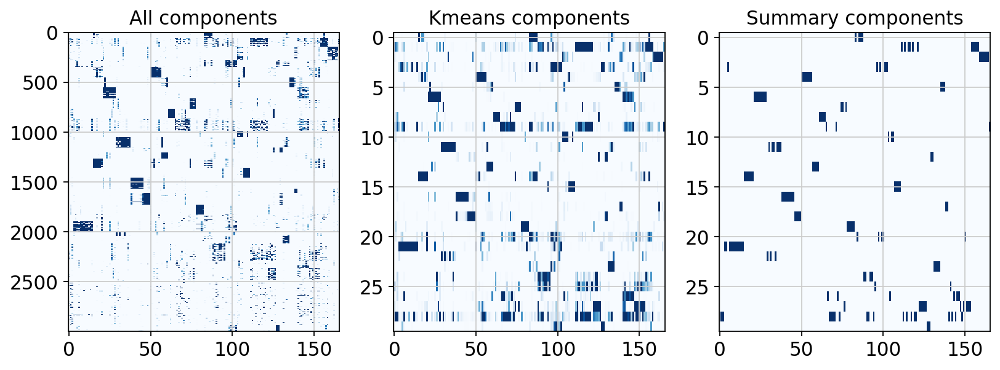

In [76]:
from util.preprocessing import summarize_onmf_decomposition

onmf_summary = summarize_onmf_decomposition(num_spin, num_repeat, num_pool, onmf_path, matrix_path, fig_folder)

In [77]:
gene_list_size = np.zeros(num_spin)
for ii in range(num_spin):
    gene_list_size[ii] = np.sum(onmf_summary.components_[ii, :] > 0.01)
gene_list_size

array([ 7., 13., 22.,  9., 12.,  8., 11.,  3.,  4., 10.,  4., 19.,  6.,
        6.,  8.,  5., 13.,  4., 22.,  9.,  5., 13.,  6.,  6.,  7., 18.,
       13., 12., 27.,  2.])

In [79]:
from sklearn.cluster import KMeans

In [80]:
rec_components = np.zeros((num_repeat, num_pool, cur_matrix.shape[1]))

for ii in range(num_repeat):
    cur_onmf = np.load('%s/onmf_%d_%d.npy' % (onmf_path, num_pool, ii + 1), allow_pickle=True).item()
    rec_components[ii] = cur_onmf.components_

all_components = rec_components.reshape(num_repeat * num_pool, -1)

In [81]:
all_components.shape

(3000, 313)

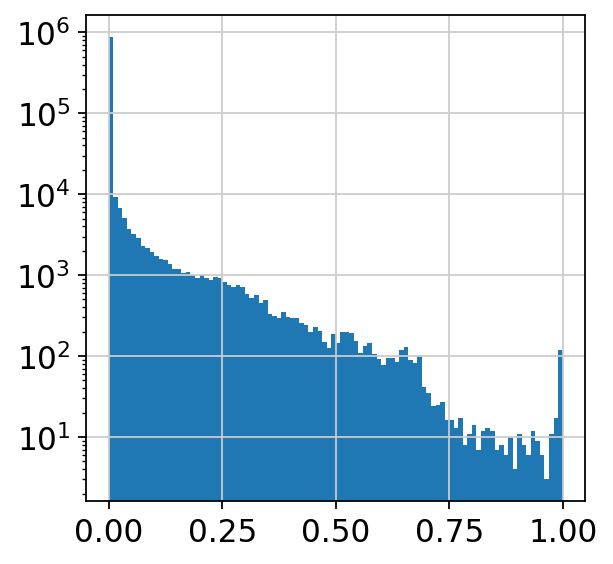

In [82]:
sc.set_figure_params(figsize=(4, 4))

plt.hist(all_components.flatten(), bins=100);
plt.yscale('log')

In [83]:
consensus = np.einsum('ij,ik->jk', all_components, all_components) / num_repeat

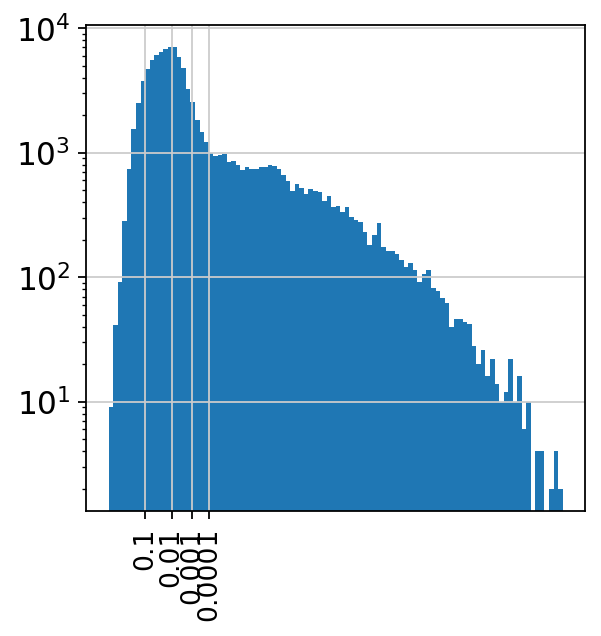

In [84]:
sc.set_figure_params(figsize=(4, 4))

plt.hist(np.sqrt(- np.log(consensus.flatten())), bins=100);
plt.yscale('log')
plt.xticks(np.sqrt(- np.log(np.array([1e-8, 1e-6, 1e-4, 1e-2]))), np.array([1e-4, 1e-3, 1e-2, 1e-1]), rotation=90, fontsize=12);

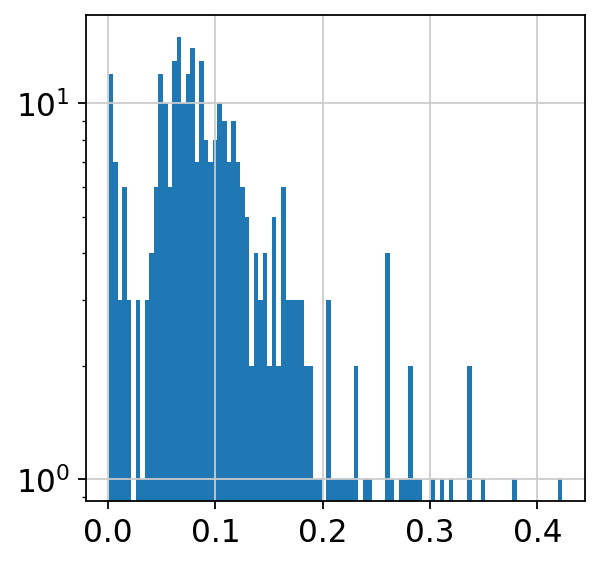

In [85]:
sc.set_figure_params(figsize=(4, 4))

plt.hist(np.max(consensus, axis=0), bins=100);
plt.yscale('log')

In [86]:
np.percentile(consensus.flatten(), 98)

0.042423112287371084

In [87]:
consensus_filt = np.where(np.max(consensus, axis=0) > np.percentile(consensus.flatten(), 98))[0]
consensus_sub = consensus[:, consensus_filt][consensus_filt]

In [88]:
consensus_sub.shape

(272, 272)

In [89]:
from sklearn.cluster import AgglomerativeClustering

clusterer = AgglomerativeClustering(n_clusters=num_spin, affinity='precomputed', linkage='complete')
# cluster_labels = clusterer.fit_predict(np.sqrt(- np.log(consensus.clip(1e-6, np.inf))))
cluster_labels = clusterer.fit_predict(np.sqrt(- np.log(consensus_sub)))

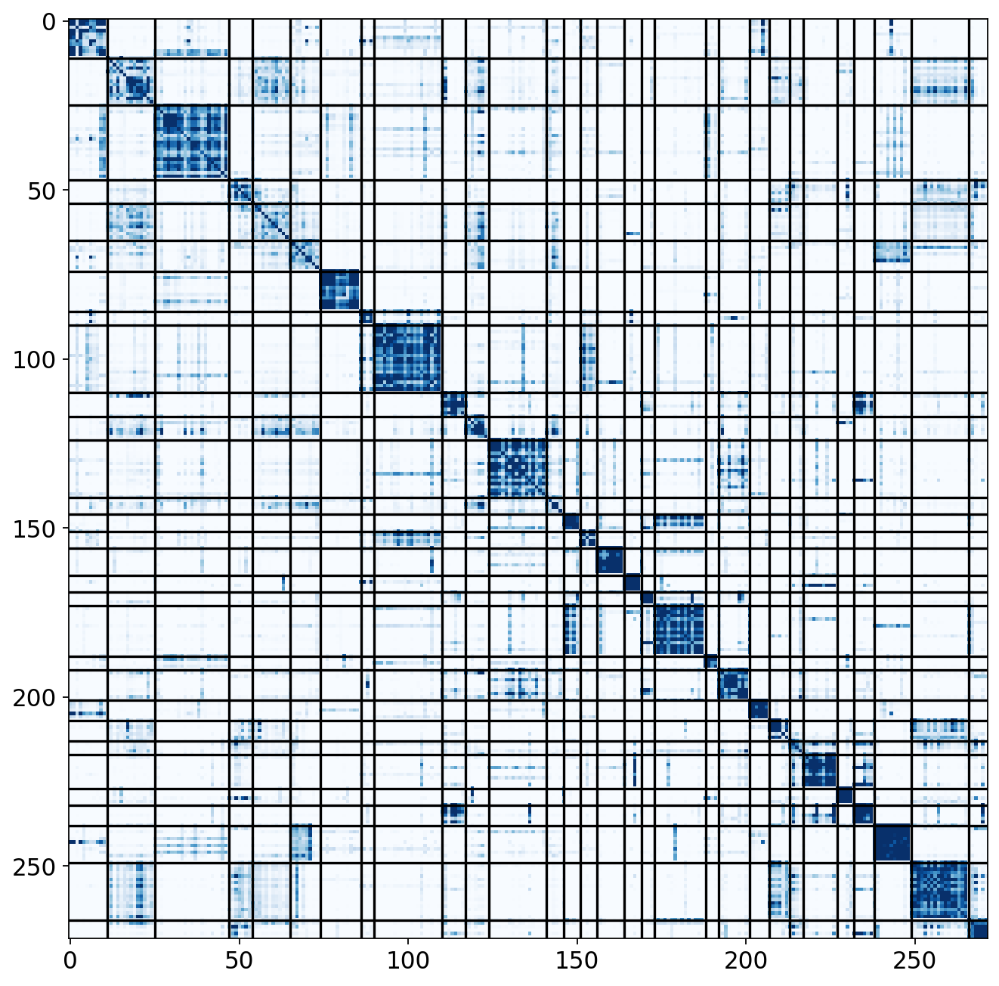

In [90]:
gene_order = np.argsort(cluster_labels)
gene_list_size = np.array([np.sum(cluster_labels == ii) for ii in range(num_spin)])

plt.figure(figsize=[10, 10])
plt.imshow(consensus_sub[gene_order][:, gene_order], cmap='Blues', vmin=0, vmax=np.percentile(consensus_sub.flatten(), 98))
for ii in range(1, num_spin):
    plt.axvline(np.sum(gene_list_size[:ii]), color='k')
    plt.axhline(np.sum(gene_list_size[:ii]), color='k')

plt.grid()

In [91]:
gene_list_size

array([11, 14, 22,  7, 11,  9, 12,  4, 20,  7,  7, 17,  5,  5,  5,  8,  5,
        4, 15,  4,  9,  6,  6,  4, 10,  5,  6, 11, 17,  6])

In [92]:
import leidenalg as la
import igraph as ig
import networkx as nx
from pyvis import network as net

In [93]:
G = nx.from_numpy_matrix(consensus)
G = ig.Graph.from_networkx(G)

optimiser = la.Optimiser()
membership = np.ones(consensus.shape[0]) * (1 + max(cluster_labels))
membership[consensus_filt] = cluster_labels
membership_fixed = np.zeros(consensus.shape[0])
membership_fixed[consensus_filt] = 1

membership = membership.astype(int)
membership_fixed = membership_fixed.astype(int)


In [94]:
G.vcount()

313

In [95]:
partition = la.RBConfigurationVertexPartition(G, initial_membership=membership, weights='weight')
diff = optimiser.optimise_partition(partition, n_iterations=- 1, is_membership_fixed=list(membership_fixed))

In [96]:
cluster_label_full = np.nan * np.ones(consensus.shape[0])
assert len(partition) == num_spin
for ii, part in enumerate(partition):
    cluster_label_full[part] = ii

In [97]:
# cluster_label_full = cluster_labels

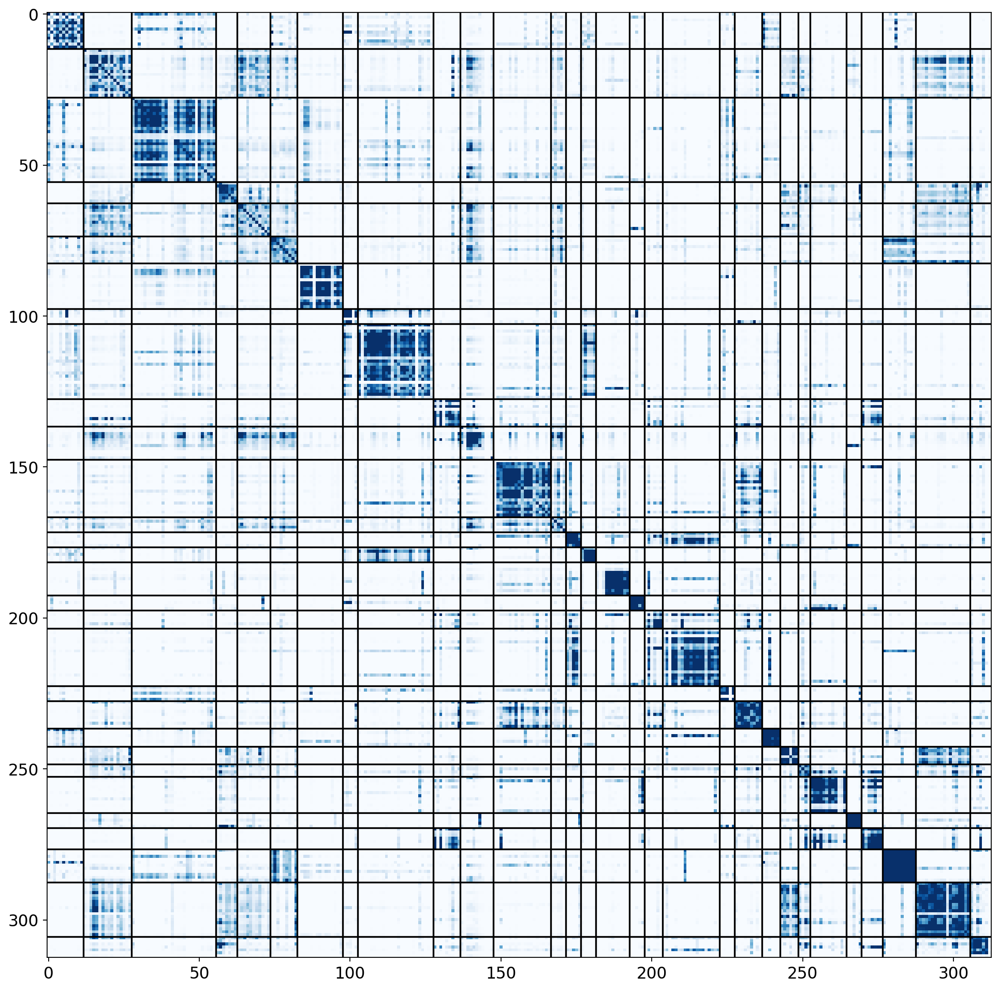

In [98]:
gene_order = np.argsort(cluster_label_full)
gene_list_size = np.array([np.sum(cluster_label_full == ii) for ii in range(num_spin)])

plt.figure(figsize=[15, 15])
plt.imshow(consensus[gene_order][:, gene_order], cmap='Blues', vmin=0, vmax=np.percentile(consensus.flatten(), 98))
for ii in range(1, num_spin):
    plt.axvline(np.sum(gene_list_size[:ii]) - 0.5, color='k')
    plt.axhline(np.sum(gene_list_size[:ii]) - 0.5, color='k')

plt.grid()

In [99]:
gene_list_size

array([12, 16, 28,  7, 11,  9, 15,  5, 25,  9, 11, 19,  5,  5,  5, 11,  5,
        6, 19,  5,  9,  6,  6,  4, 12,  5,  7, 11, 18,  7])

In [100]:
gene_matrix = cur_matrix

In [101]:
from sklearn.preprocessing import normalize
from sklearn.decomposition import NMF

components_summary = np.zeros((num_spin, gene_matrix.shape[1]))
for ii in range(num_spin):
    filt_genes = cluster_label_full == ii
    # filt_genes = components_kmeans[ii] > 1e-3
    sub_matrix = gene_matrix[:, filt_genes]

    sub_onmf = NMF(n_components=1, init='random', random_state=0).fit(sub_matrix)
    components_summary[ii, filt_genes] = sub_onmf.components_[0]
components_summary = normalize(components_summary, axis=1, norm='l2')

onmf_summary = NMF(n_components=num_spin, init='random', random_state=0)
onmf_summary.components_ = components_summary

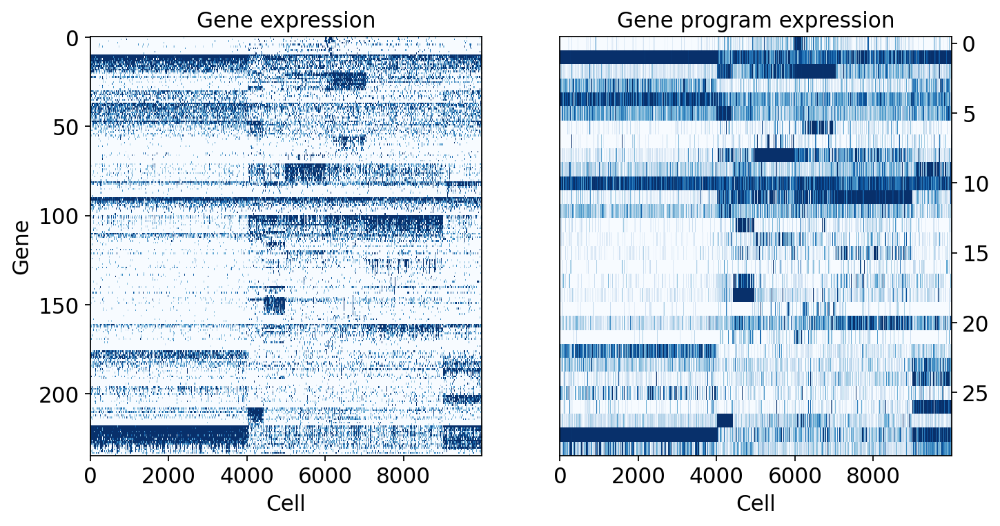

In [102]:
from sklearn.cluster import KMeans

features = onmf_summary.components_
onmf_rep_tri = onmf_summary.transform(cur_matrix)
num_gene_select = 10
gene_mod_ind = np.argmax(features, axis=0)

gene_mod_use = []
for ind in range(num_spin):
    ii = ind
    gene_in_mod = np.where(gene_mod_ind == ii)[0]
    cur_gene = gene_in_mod[np.argsort(- features[ii, gene_in_mod])[: num_gene_select]]
    gene_mod_use += list(cur_gene)
gene_mod_use = np.array(gene_mod_use)

np.random.seed(0)
subset_ind = np.random.choice(range(gene_matrix.shape[0]), size=10000, replace=False)
cell_order = np.argsort(KMeans(n_clusters=8).fit_predict(onmf_rep_tri[subset_ind, :]))
gene_matrix_subset = gene_matrix[subset_ind, :][:, gene_mod_use]
gene_matrix_subset /= np.max(gene_matrix, axis=0)[gene_mod_use].clip(0.05, np.inf)

sc.set_figure_params(figsize=[10, 5])

plt.subplot(1, 2, 1)
plt.imshow(gene_matrix_subset[cell_order, :].T, aspect='auto', cmap='Blues', interpolation='none', vmax=np.percentile(gene_matrix_subset.flatten(), 90))
plt.ylabel('Gene')
plt.xlabel('Cell')
plt.title('Gene expression')
plt.grid()

plt.subplot(1, 2, 2)
plt.imshow(onmf_rep_tri[subset_ind, :][cell_order, :].T, aspect='auto', cmap='Blues', interpolation='none', vmax=np.percentile(onmf_rep_tri.flatten(), 90))
# plt.yticks(range(num_spin), spin_name_extend, fontsize=12)
plt.gca().yaxis.set_ticks_position('right')
plt.xlabel('Cell');
plt.title('Gene program expression')
plt.grid()

In [60]:
os.mkdir(fig_folder + 'onmf_%d_%d' % (num_spin, num_pool))

'20230728_breast_cancer_10x/figure/onmf_30_30/onmf_gene_program_info.png'

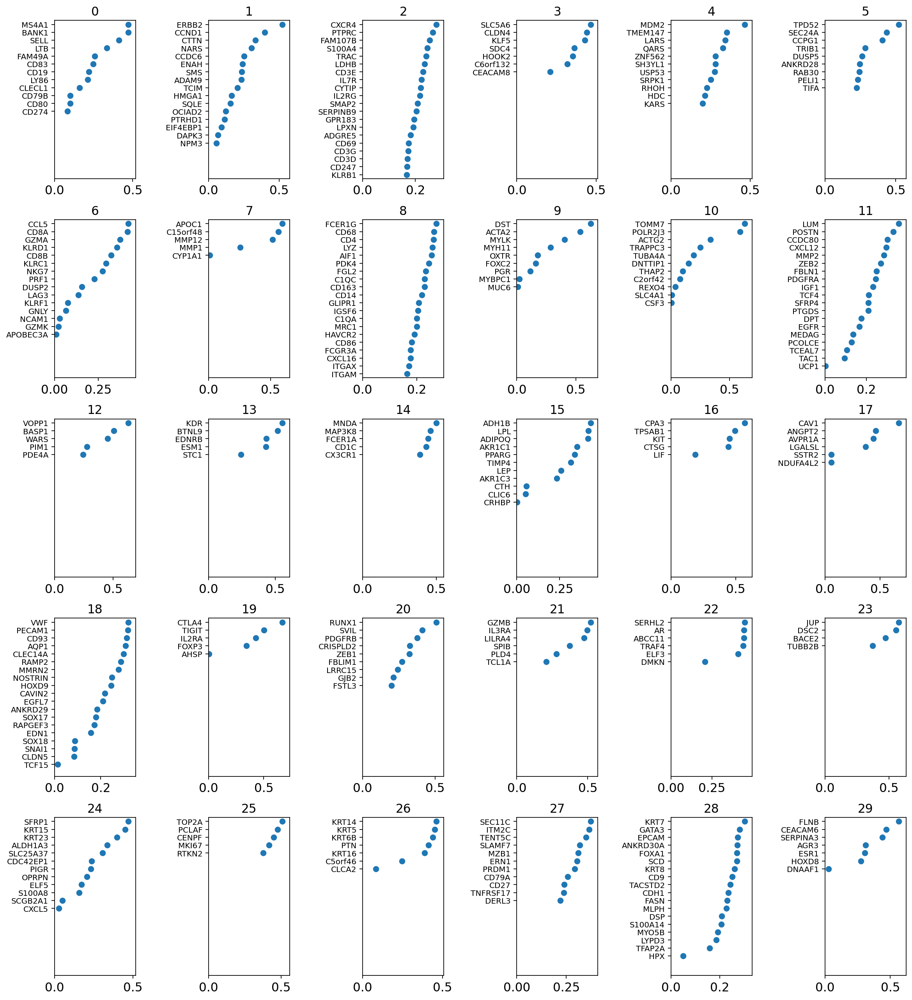

In [103]:
from util.plotting import onmf_gene_program_info

num_gene_show = 20
features = onmf_summary.components_
gene_name = cadata.var_names

onmf_gene_program_info(features, gene_name, num_gene_show, fig_folder + 'onmf_%d_%d/' % (num_spin, num_pool))

In [41]:
np.save(data_folder + 'onmf_summary_%d_%d_v2.npy' % (num_spin, num_pool), onmf_summary)
# onmf_summary = np.load(data_folder + 'onmf_summary_%d_%d.npy' % (num_spin, num_pool), allow_pickle=True).item()

In [105]:
from util.plotting import onmf_to_csv

features = onmf_summary.components_
gene_name = cadata.var_names
cur_filen = onmf_to_csv(features, gene_name, data_folder, thres=0.05)
pd_csv = pd.read_csv(cur_filen)
pd_csv.to_csv(data_folder + 'onmf_gene_list_%d_%d.csv' % (num_spin, num_pool), header=True, index=False)

In [108]:
balance_matrix = np.load(matrix_path_ori)

gene_matrix = cadata.X.astype(np.float64)
gene_matrix /= balance_matrix.std(axis=0)

onmf_rep_ori = onmf_summary.transform(gene_matrix)
onmf_rep = np.apply_along_axis(lambda x : x / np.percentile(x, 95), axis=0, arr=onmf_rep_ori)
onmf_rep = np.clip(onmf_rep, 0, 5)

/home/jjiang3/miniconda3/envs/scvi/lib/python3.7/site-packages/sklearn/utils/validation.py:598: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  FutureWarning,


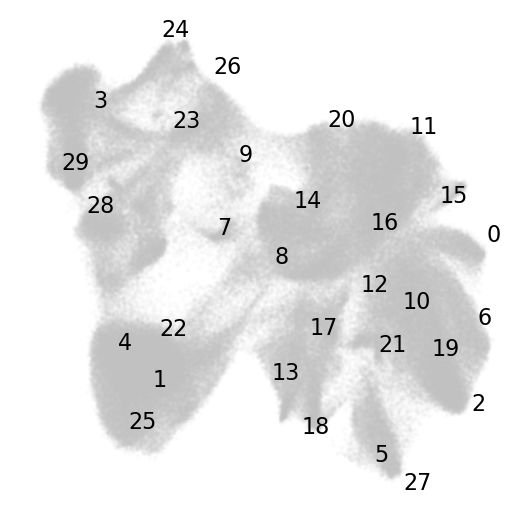

In [109]:
from util.plotting import assign_program_position

program_umap_pos = assign_program_position(onmf_rep_ori.copy(), cadata.obsm['X_umap'], repulsion=4)

'20230728_breast_cancer_10x/figure/onmf_30_30/gene_program_on_umap.png'

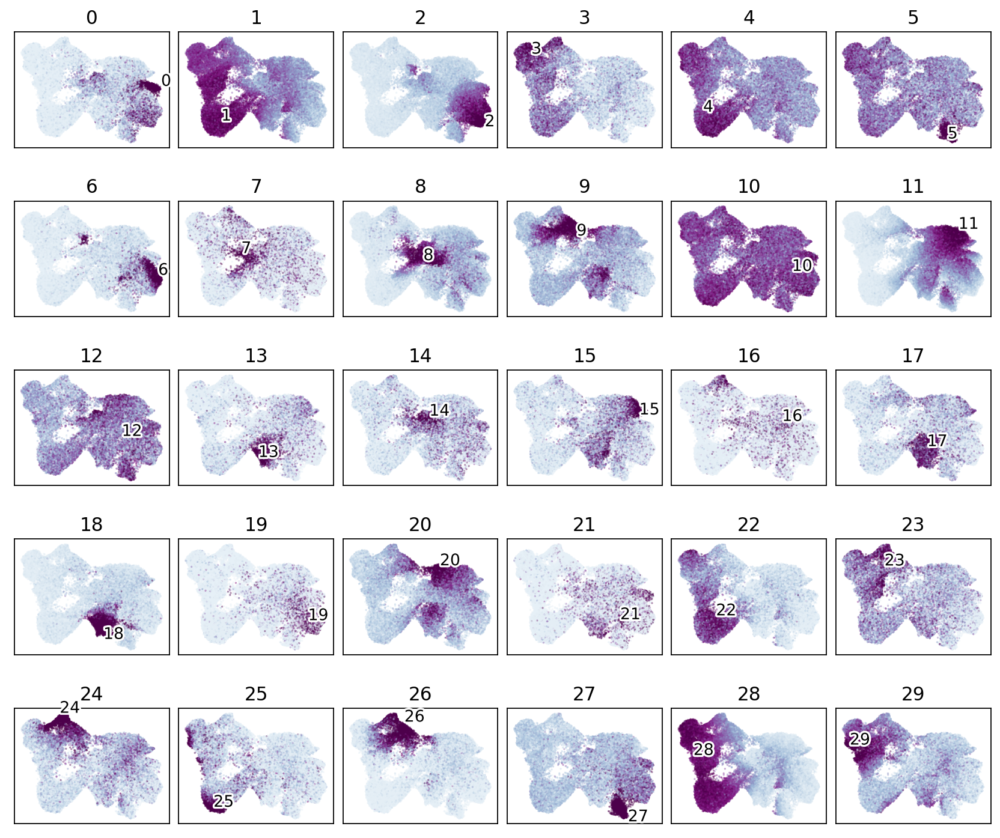

In [110]:
from util.plotting import gene_program_on_umap

gene_program_on_umap(onmf_rep, cadata.obsm['X_umap'], program_umap_pos, fig_folder + 'onmf_%d_%d/' % (num_spin, num_pool))

In [113]:
gene_annotation = pd.read_csv(data_folder + 'gene_annotation.csv')

anno_dict = {}

for ii in range(len(gene_annotation)):
    anno_dict[gene_annotation['Genes'][ii]] = gene_annotation['Annotation'][ii]


In [122]:
pd_csv = pd.read_csv(data_folder + 'onmf_gene_list_%d_%d.csv' % (num_spin, num_pool))

for ii in range(num_spin):
    cur_anno = []
    for gene in pd_csv[str(ii)]:
        try:
            cur_anno.append(anno_dict[gene])
        except:
            cur_anno.append('NA')
    val, counts = np.unique(cur_anno, return_counts=True)
    data_order = np.argsort(counts)[::-1]
    print(ii, val[data_order], counts[data_order])

0 ['NA' 'B cells' 'T cells' 'Macrophages' 'Dendritic cells'] [13  5  3  3  1]
1 ['Breast glandular cells' 'NA' 'Breast cancer'
 'Breast myoepithelial cells'] [12 10  2  1]
2 ['T cells' 'Breast cancer' 'Macrophages' 'Dendritic cells' 'B cells'
 'NK cells' 'NA' 'Immune cells' 'Breast glandular cells'] [12  3  2  2  2  1  1  1  1]
3 ['NA' 'Breast glandular cells' 'Breast myoepithelial cells' 'Neutrophils'] [19  3  2  1]
4 ['NA' 'Breast glandular cells' 'T cells' 'Smooth muscle cells'
 'Breast myoepithelial cells' 'Breast cancer'] [15  6  1  1  1  1]
5 ['NA' 'B cells' 'Macrophages' 'Endothelial cells' 'Breast glandular cells'] [16  6  1  1  1]
6 ['NA' 'T cells' 'NK cells'] [14  6  5]
7 ['NA' 'Fibroblasts' 'Macrophages' 'Breast glandular cells'] [21  2  1  1]
8 ['Macrophages' 'NA' 'T cells' 'Smooth muscle cells' 'Monocytes' 'NK cells'
 'Myeloid cells' 'Dendritic cells' 'Breast myoepithelial cells'
 'Adipocytes'] [11  3  2  2  2  1  1  1  1  1]
9 ['NA' 'Smooth muscle cells' 'Breast myoepithe

In [111]:
cadata

AnnData object with n_obs × n_vars = 263903 × 313
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'batch', 'leiden'
    var: 'gene_ENSG', 'gene_name', 'gene_type'
    uns: 'batch_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

  0%|                                                    | 0/30 [00:00<?, ?it/s]

100%|███████████████████████████████████████████| 30/30 [00:18<00:00,  1.66it/s]


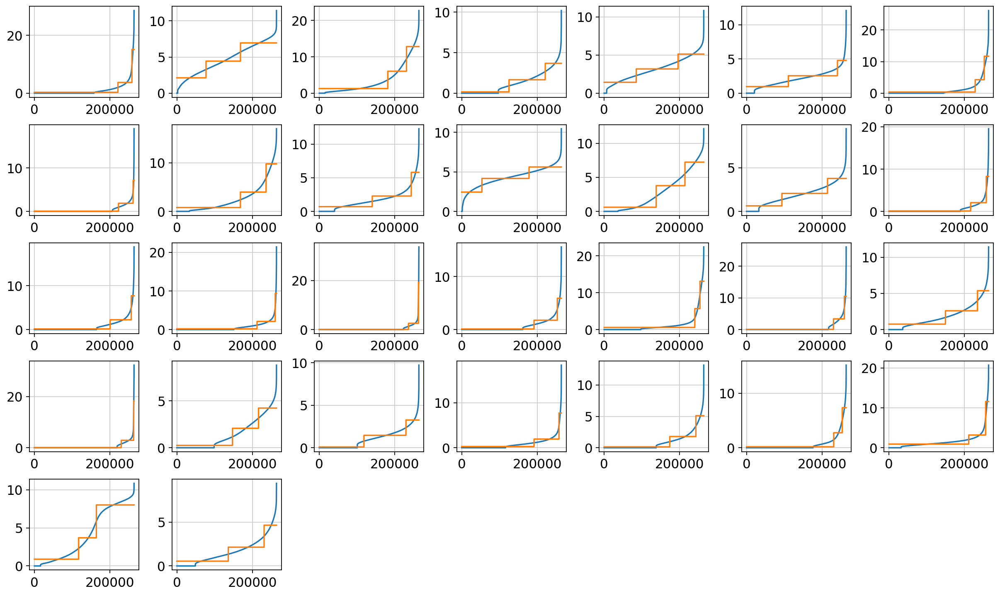

In [112]:
from util.preprocessing import onmf_discretize

onmf_rep_tri, rec_kmeans = onmf_discretize(onmf_rep_ori, fig_folder)

In [37]:
from scipy.spatial.distance import pdist, squareform

In [38]:
cadata

AnnData object with n_obs × n_vars = 201737 × 2514
    obs: 'sample', 'risk', 'x', 'y', 'position', 'final_cellTypes', 'UMAP_1', 'UMAP_2', 'sample_id', 'cell_type'
    uns: 'log1p'
    obsm: 'X_umap', 'spatial'
    layers: 'counts'

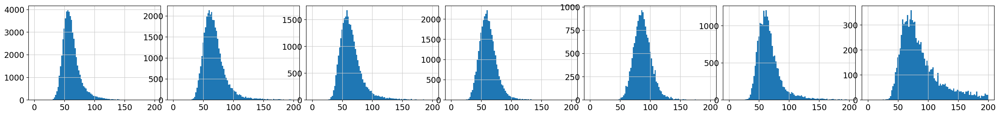

In [39]:
sc.set_figure_params(figsize=[4, 3])
fig, grid = sc.pl._tools._panel_grid(0.05, 0.05, ncols=10, num_panels=len(samp_list))

for ii, cur_samp in enumerate(samp_list):
    
    ax = plt.subplot(grid[ii])
    cadata_sub = cadata[cadata.obs['sample_id'] == cur_samp]
    onmf_rep_sub = onmf_rep[cadata.obs['sample_id'] == cur_samp]

    cur_spatial_pos = cadata_sub.obsm['spatial']
    all_dist = pdist(cur_spatial_pos)
    all_dist_sq = squareform(all_dist)
    np.fill_diagonal(all_dist_sq, 1e5)
    cell_min_dist = np.min(all_dist_sq, axis=0)

    sc.set_figure_params(figsize=[5, 3])
    plt.hist(cell_min_dist, bins=np.linspace(0, 200, 100));


In [40]:
batch_list = list(cadata.obs['sample_id'].unique())
celltype_list = list(cadata.obs['cell_type'].unique())

In [41]:
from tqdm import tqdm

cur_dist_lim = 300

cadata.obsm['cell_env'] = np.zeros([cadata.shape[0], len(celltype_list)])

for cbatch in batch_list: 
    cadata_sub = cadata[cadata.obs['sample_id'] == cbatch]
    # ctype_filt = np.where(np.isin(cadata_sub.obs['Celltype'], use_ctype))[0]

    rec_ctype_env = np.zeros([cadata_sub.shape[0], len(celltype_list)])
    ctype_ind, ctype_clist = pd.factorize(cadata_sub.obs['cell_type'])
    
    map_ind = np.array([celltype_list.index(ctype) for ctype in ctype_clist])
    ctype_ind = map_ind[ctype_ind]

    cur_spatial_pos = cadata_sub.obsm['spatial']

    all_dist = pdist(cur_spatial_pos)
    all_dist_sq = squareform(all_dist)
    np.fill_diagonal(all_dist_sq, 1e5)

    for ii in tqdm(range(cadata_sub.shape[0])):
        cur_dist = all_dist_sq[ii]
        cur_dist_filt = cur_dist <= cur_dist_lim
        cur_ctype = ctype_ind[cur_dist_filt]
        rec_ctype_env[ii] = np.bincount(cur_ctype, minlength=len(celltype_list))

    cadata.obsm['cell_env'][cadata.obs['sample_id'] == cbatch] = rec_ctype_env

100%|███████████████████████████████████| 15979/15979 [00:02<00:00, 5682.84it/s]


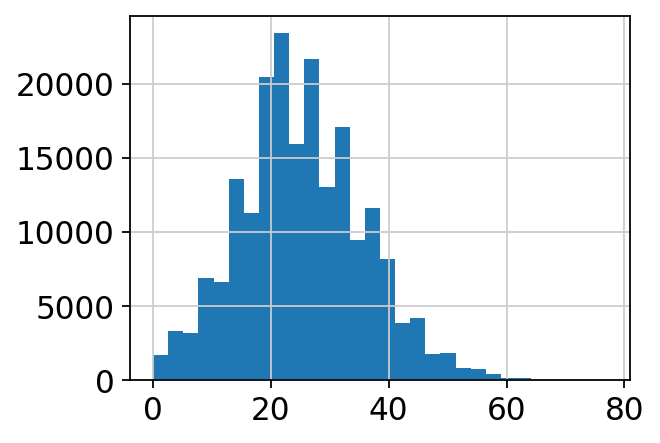

In [42]:
num_neighbor = cadata.obsm['cell_env'].sum(axis=1)

sc.set_figure_params(figsize=[4, 3])
plt.hist(num_neighbor, bins=30);

In [43]:
cadata.obsm['cell_env_norm'] = cadata.obsm['cell_env'] / np.sum(cadata.obsm['cell_env'], axis=1).clip(1, np.inf)[:, None]

In [44]:
np.sum(num_neighbor >= 15) / len(num_neighbor)

0.8494178063518343

In [45]:
cadata_filt = cadata[num_neighbor >= 15]
onmf_rep_tri = onmf_rep_tri[num_neighbor >= 15, :]

In [51]:
cadata_filt

View of AnnData object with n_obs × n_vars = 171359 × 2514
    obs: 'sample', 'risk', 'x', 'y', 'position', 'final_cellTypes', 'UMAP_1', 'UMAP_2', 'sample_id', 'cell_type'
    uns: 'log1p'
    obsm: 'X_umap', 'spatial', 'cell_env', 'cell_env_norm'
    layers: 'counts'

In [47]:
cadata_filt.obs['sample_id'].value_counts()

P1098_low     52167
P4054_low     31964
P4196_high    31788
P4181_high    22595
P4299_high    17287
P4253_low     12351
P4309_high     3207
Name: sample_id, dtype: int64

In [48]:
cadata_filt.obs['cell_type'].value_counts()

cancer          78046
CD4 T           22944
B               21673
fibroblasts1    15772
CD8 T           14119
endothelila      7983
fibroblasts2     2428
Mono             2361
NK               1936
other            1687
DC               1437
other T           973
Name: cell_type, dtype: int64

In [49]:
state_list = []
neighbor_list = []
samp_list = []

for cur_samp in np.unique(cadata_filt.obs['sample_id']):
    
    cur_filt1 = cadata_filt.obs['sample_id'] == cur_samp
    # mean_neighbor = np.mean(cadata_filt.obsm['cell_env_norm'][cur_filt1, :], axis=0)

    for cur_type in np.unique(cadata_filt.obs['cell_type']):

        cur_filt2 = cadata_filt.obs['cell_type'] == cur_type
        cur_filt = cur_filt1 & cur_filt2

        if np.sum(cur_filt) > 50:
            cur_state = onmf_rep_tri[cur_filt, :] * 2 - 1
            state_list.append(cur_state.T)
            cur_neighbor = cadata_filt.obsm['cell_env_norm'][cur_filt, :] - cadata_filt.obsm['cell_env_norm'][cur_filt, :].mean(axis=0)
            neighbor_list.append(cur_neighbor.T)
            samp_list.append(cur_samp + '_' + cur_type)



In [52]:
import numba

@numba.njit
def np_apply_along_axis(func1d, axis, arr):
  assert arr.ndim == 2
  assert axis in [0, 1]
  if axis == 0:
    result = np.empty(arr.shape[1])
    for i in range(len(result)):
      result[i] = func1d(arr[:, i])
  else:
    result = np.empty(arr.shape[0])
    for i in range(len(result)):
      result[i] = func1d(arr[i, :])
  return result

@numba.njit
def np_mean(array, axis):
  return np_apply_along_axis(np.mean, axis, array)

@numba.jit()
def compute_gradient(cur_j, cur_h, neighbor_project, cur_state, cur_neighbor):
    num_spin = cur_j.shape[0]
    num_type = cur_neighbor.shape[0]

    cur_j_grad = np.zeros((num_spin, num_spin))
    cur_h_grad = np.zeros((num_spin, 1))
    neighbor_project_grad = np.zeros((num_spin, num_type))
    effective_h = cur_j.dot(cur_state) + cur_h + neighbor_project.dot(cur_neighbor)

    for ii in range(num_spin):
        j_sub = cur_j[ii, ii]
        h_sub = effective_h[ii, :]

        term1 = np.exp(j_sub + h_sub)
        term2 = np.exp(j_sub - h_sub)

        j_sub_grad = cur_state[ii, :] ** 2 - (term1 + term2) / (term1 + term2 + 1)
        h_eff_grad = cur_state[ii, :] - (term1 - term2) / (term1 + term2 + 1)

        j_off_sub_grad = h_eff_grad * cur_state
        nei_project_sub_grad = h_eff_grad * cur_neighbor

        cur_j_grad[ii, :] = np_mean(j_off_sub_grad, axis=1)
        cur_j_grad[ii, ii] = np.mean(j_sub_grad)

        cur_h_grad[ii] = np.mean(h_eff_grad)
        neighbor_project_grad[ii, :] = np_mean(nei_project_sub_grad, axis=1)

        cur_j_grad = (cur_j_grad + cur_j_grad.T) / 2

    return cur_j_grad, cur_h_grad, neighbor_project_grad

In [62]:
np.array([neighbor.shape[1] for neighbor in neighbor_list])

array([15987, 18172,  5467,  1001,   437,   328,  2810,  2024,  4178,
         720,   436,   607,  3666,  2669,  4355,   210,   714,   733,
        8645,  2279,  7934,   394,   185,   180,  1372,  1194,  2454,
         213,   876,   518, 14100,   424,   942,   331,   136,   106,
         186,   562,   201, 27532,  1096,  1042,   292,   719,   107,
          57,   454,    76, 10803,   417,   255,    90,   406,   548,
         735,    53, 12666,  1145,  1133,   380,   172,   118,    92,
         244,  1490,   598,   288,   264])

In [96]:
np.sum(neighbor.shape[1] for neighbor in neighbor_list)

/home/jjiang3/miniconda3/envs/scvi/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  """Entry point for launching an IPython kernel.


171018

In [63]:
num_type = neighbor_list[0].shape[0]
num_sample = len(state_list)
# Initializing some random starting values
cur_j = np.zeros([num_spin, num_spin])
cur_h = np.zeros([num_spin, num_sample])
neighbor_project = np.zeros([num_spin, num_type, num_sample])

In [120]:
jj = 0
gradient = compute_gradient(cur_j, cur_h[:, jj].reshape(- 1, 1), neighbor_project[:, :, jj], state_list[jj], neighbor_list[jj])


In [79]:
from tqdm import tqdm

num_type = neighbor_list[0].shape[0]
num_sample = len(state_list)
# Initializing some random starting values
cur_j = np.zeros([num_spin, num_spin])
cur_h = np.zeros([num_spin, num_sample])
neighbor_project = np.zeros([num_spin, num_type, num_sample])


# Initialize list to hold gradient values for plotting
all_gradients = []

# Parameters
num_iterations = 500
initial_learning_rate = 0.2
decay_rate = 0.001
l1_neighbor = 0.01
l1_thres = 0.05

# Stochastic Gradient Ascent
pbar = tqdm(range(1, num_iterations + 1))
for ii in pbar:
    j_grad = np.zeros([num_spin, num_spin])
    h_grad = np.zeros([num_spin, num_sample])
    neighbor_project_grad = np.zeros([num_spin, num_type, num_sample])
    for jj in range(num_sample):
        gradient = compute_gradient(cur_j, cur_h[:, jj].reshape(- 1, 1), neighbor_project[:, :, jj], state_list[jj], neighbor_list[jj])
        j_grad += gradient[0]
        h_grad[:, jj] = gradient[1].reshape(- 1)
        # neighbor_project_grad[:, :, jj] = gradient[2] - l1_neighbor * np.where(np.abs(neighbor_project[:, :, jj]) < l1_thres, 0, np.sign(neighbor_project[:, :, jj]))
        neighbor_project_grad[:, :, jj] = gradient[2] - l1_neighbor * (neighbor_project[:, :, jj] / l1_thres).clip(- 1, 1)
    j_grad /= num_sample

    all_gradients.append([np.linalg.norm(j_grad), np.linalg.norm(h_grad), np.linalg.norm(neighbor_project_grad)])
    pbar.set_description("Grad %f %f %f" % tuple(all_gradients[-1]))

    # Compute decayed learning rate
    learning_rate = initial_learning_rate / (1 + decay_rate * ii)

    # Update the parameters in the direction of the gradient
    cur_j += learning_rate * j_grad
    cur_h += learning_rate * h_grad
    neighbor_project += learning_rate * neighbor_project_grad


Grad 0.027309 0.380059 0.194389: 100%|████████| 500/500 [22:44<00:00,  2.73s/it]


In [77]:
num_type = neighbor_list[0].shape[0]
num_sample = len(state_list)
# Initializing some random starting values
cur_j = np.zeros([num_spin, num_spin])
cur_h = np.zeros([num_spin, num_sample])
neighbor_project = np.zeros([num_spin, num_type, num_sample])


# Initialize list to hold gradient values for plotting
all_gradients = []

# Parameters
num_iterations = 50
initial_learning_rate = 0.2
decay_rate = 0.001
l1_neighbor = 0.01
l1_thres = 0.05

# Hyperparameters for Adam
beta1 = 0.9
beta2 = 0.999
epsilon = 1e-8

# Initialize Adam parameters
m_j, v_j = np.zeros([num_spin, num_spin]), np.zeros([num_spin, num_spin])
m_h, v_h = np.zeros([num_spin, num_sample]), np.zeros([num_spin, num_sample])
m_neighbor_project, v_neighbor_project = np.zeros([num_spin, num_type, num_sample]), np.zeros([num_spin, num_type, num_sample])

# Adam optimization
pbar = tqdm(range(1, num_iterations + 1))
for ii in pbar:
    j_grad = np.zeros([num_spin, num_spin])
    h_grad = np.zeros([num_spin, num_sample])
    neighbor_project_grad = np.zeros([num_spin, num_type, num_sample])

    for jj in range(num_sample):
        # Compute the gradient
        gradient = compute_gradient(cur_j, cur_h[:, jj].reshape(- 1, 1), neighbor_project[:, :, jj], state_list[jj], neighbor_list[jj])
        j_grad += gradient[0]
        h_grad[:, jj] = gradient[1].reshape(- 1)
        neighbor_project_grad[:, :, jj] = gradient[2] - l1_neighbor * (neighbor_project[:, :, jj] / l1_thres).clip(- 1, 1)

    j_grad /= num_sample

    all_gradients.append([np.linalg.norm(j_grad), np.linalg.norm(h_grad), np.linalg.norm(neighbor_project_grad)])
    pbar.set_description("Grad %f %f %f" % tuple(all_gradients[-1]))

    # Compute decayed learning rate
    learning_rate = initial_learning_rate / (1 + decay_rate * ii)

    # Adam update for parameters
    m_j = beta1 * m_j + (1 - beta1) * j_grad
    v_j = beta2 * v_j + (1 - beta2) * (j_grad**2)
    m_hat_j = m_j / (1 - beta1**ii)
    v_hat_j = v_j / (1 - beta2**ii)
    cur_j += learning_rate * m_hat_j / (np.sqrt(v_hat_j) + epsilon)

    m_h = beta1 * m_h + (1 - beta1) * h_grad
    v_h = beta2 * v_h + (1 - beta2) * (h_grad**2)
    m_hat_h = m_h / (1 - beta1**ii)
    v_hat_h = v_h / (1 - beta2**ii)
    cur_h += learning_rate * m_hat_h / (np.sqrt(v_hat_h) + epsilon)

    m_neighbor_project = beta1 * m_neighbor_project + (1 - beta1) * neighbor_project_grad
    v_neighbor_project = beta2 * v_neighbor_project + (1 - beta2) * (neighbor_project_grad**2)
    m_hat_neighbor_project = m_neighbor_project / (1 - beta1**ii)
    v_hat_neighbor_project = v_neighbor_project / (1 - beta2**ii)
    neighbor_project += learning_rate * m_hat_neighbor_project / (np.sqrt(v_hat_neighbor_project) + epsilon)

Grad 0.976193 3.479259 0.347547: 100%|██████████| 50/50 [02:17<00:00,  2.75s/it]


In [ ]:
np.savez(data_folder + 'pseudo_dspin_data_v2.npz', cur_j, cur_h, neighbor_project)

In [134]:
np.linalg.norm(all_gradients[0][2])

0.994629414510106

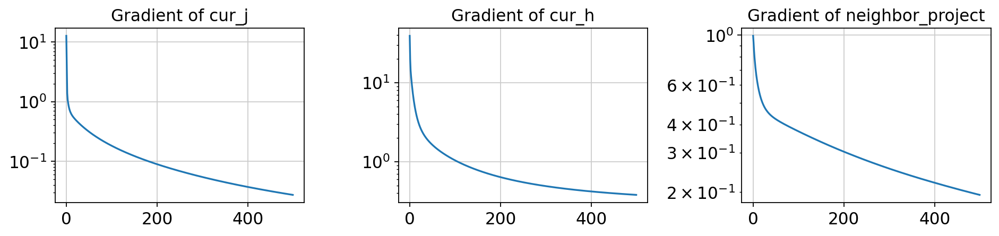

In [80]:
# Plotting gradients
plt.figure(figsize=(12, 3))

# Gradient for cur_j
plt.subplot(131)
plt.plot([gradient[0] for gradient in all_gradients])
plt.yscale('log')
plt.title("Gradient of cur_j")

# Gradient for cur_h
plt.subplot(132)
plt.plot([gradient[1] for gradient in all_gradients])
plt.yscale('log')
plt.title("Gradient of cur_h")

# Gradient for neighbor_project
plt.subplot(133)
plt.plot([gradient[2] for gradient in all_gradients])
plt.yscale('log')
plt.title("Gradient of neighbor_project")

plt.tight_layout()
plt.show()

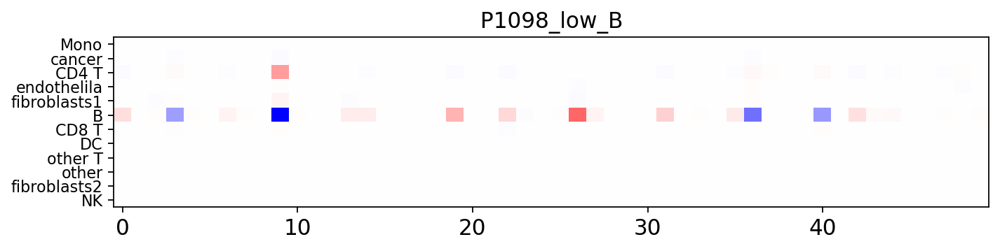

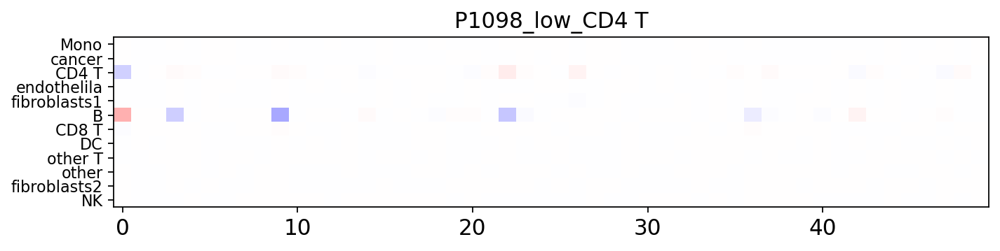

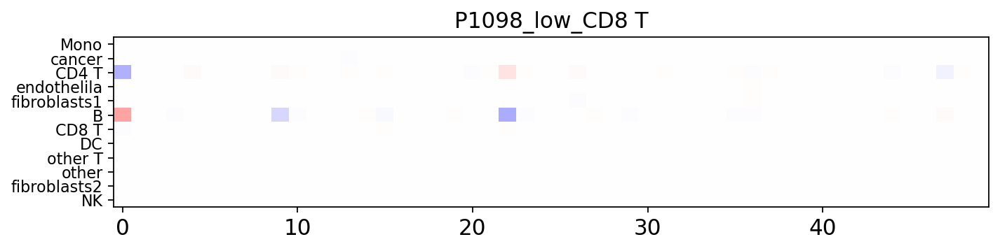

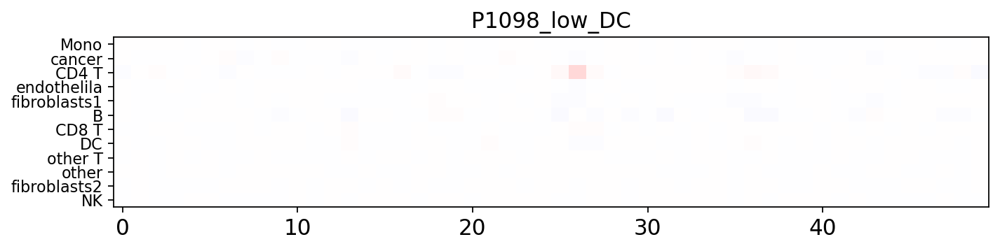

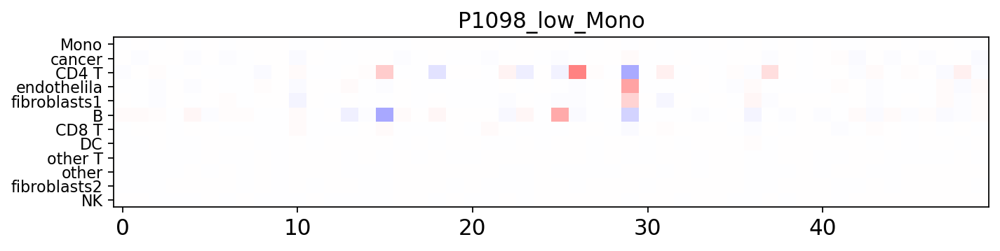

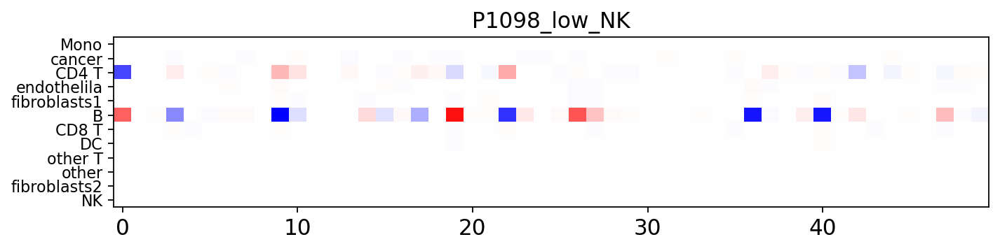

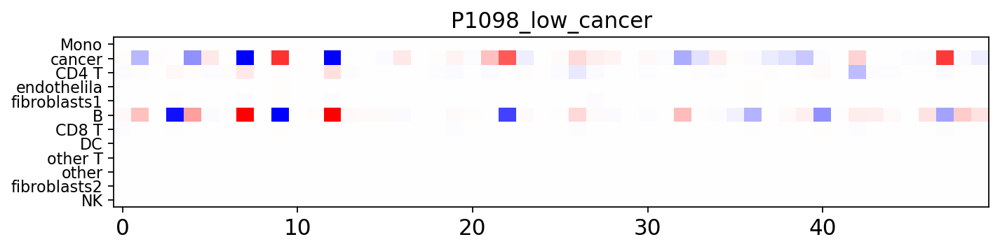

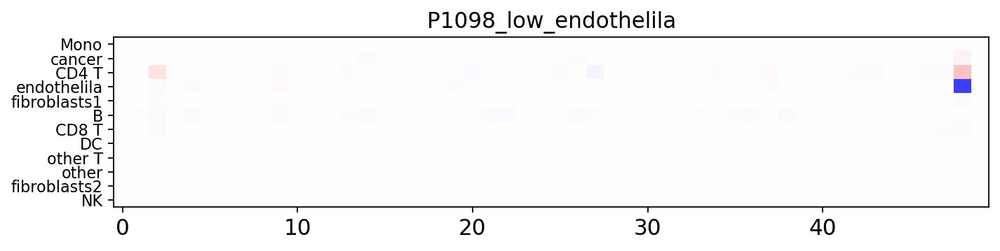

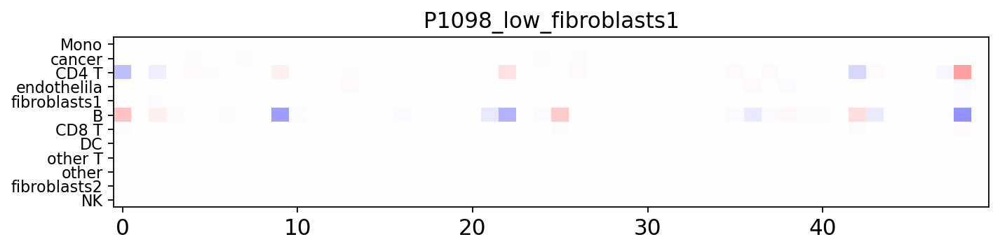

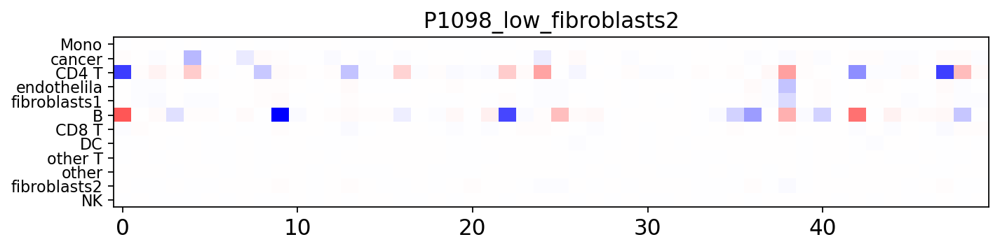

In [81]:
sc.set_figure_params(figsize=[10, 2])

for ii in range(len(samp_list[: 10])):
    plt.figure()
    plt.imshow(neighbor_project[:, :, ii].T, cmap='bwr_r', vmin=- 2, vmax=2, aspect='auto')
    plt.title(samp_list[ii])
    plt.yticks(np.arange(len(celltype_list)), celltype_list, fontsize=10)
    # plt.xticks(np.arange(len(spin_order)), spin_order, fontsize=10, rotation=90)
    plt.grid()
    plt.show()

In [82]:
j_mat = cur_j

/home/jjiang3/miniconda3/envs/scvi/lib/python3.7/site-packages/ipykernel_launcher.py:3: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  This is separate from the ipykernel package so we can avoid doing imports until


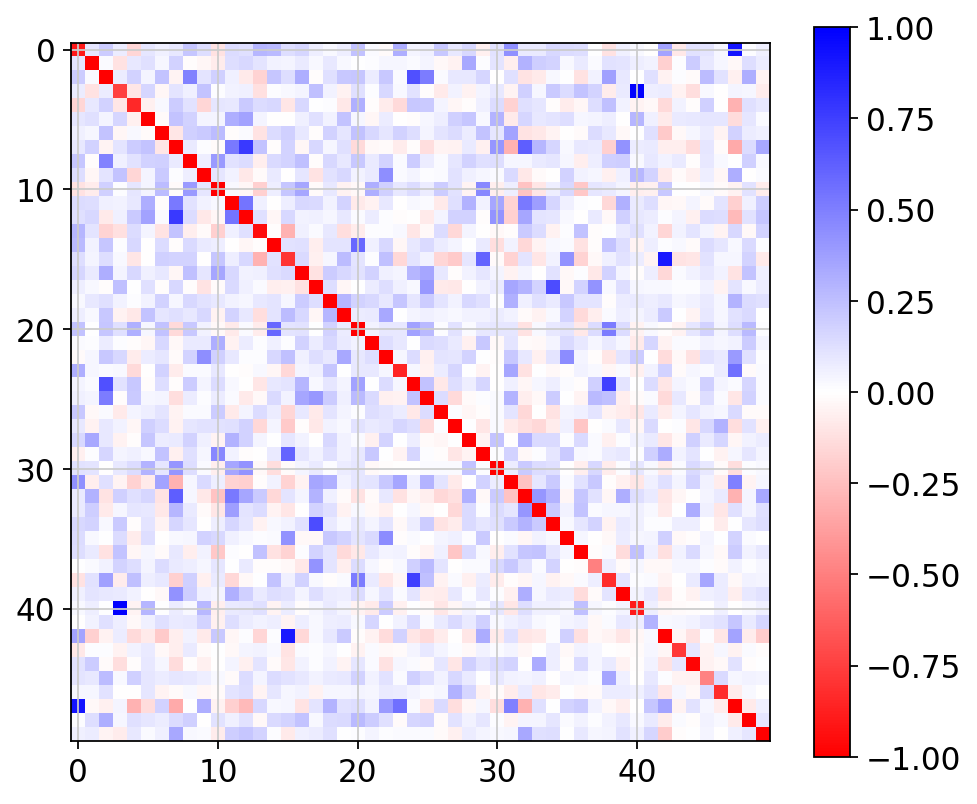

In [84]:
sc.set_figure_params(figsize=[7, 6])
plt.imshow(j_mat, cmap='bwr_r', vmin=- 1, vmax=1)
plt.colorbar()

In [85]:
import leidenalg as la
import igraph as ig
import networkx as nx
from pyvis import network as net

In [90]:
thres = 0
j_filt = j_mat.copy()
j_filt[np.abs(j_mat) < thres] = 0
np.fill_diagonal(j_filt, 0)
G = nx.from_numpy_matrix(j_filt)

G = ig.Graph.from_networkx(G)
G_pos = G.subgraph_edges(G.es.select(weight_gt = 0), delete_vertices=False);
G_neg = G.subgraph_edges(G.es.select(weight_lt = 0), delete_vertices=False);
G_neg.es['weight'] = [-w for w in G_neg.es['weight']]

part_pos = la.RBConfigurationVertexPartition(G_pos, weights='weight', resolution_parameter=2)
part_neg = la.RBConfigurationVertexPartition(G_neg, weights='weight', resolution_parameter=2)
optimiser = la.Optimiser()
diff = optimiser.optimise_partition_multiplex(
  [part_pos, part_neg], n_iterations=- 1,
  layer_weights=[1,-1]);

In [91]:
for group in part_pos:
    print(group)

[1, 5, 7, 11, 12, 28, 30, 32, 33, 39, 49]
[2, 4, 14, 16, 20, 24, 25, 38, 45]
[0, 13, 23, 26, 31, 36, 43, 44, 47]
[10, 15, 21, 29, 35, 42]
[3, 9, 22, 40]
[17, 34, 37]
[27, 41, 46]
[18, 19]
[8]
[48]
[6]


In [92]:
net_class = list(part_pos)
spin_order = [spin for cur_list in net_class for spin in cur_list]
net_class_len = [len(cur_list) for cur_list in net_class]

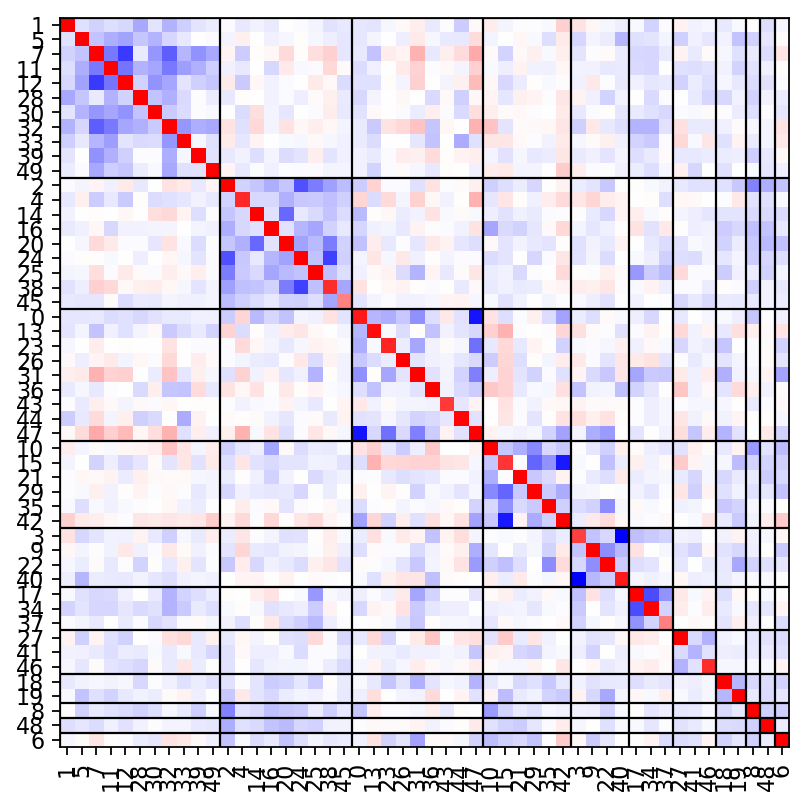

In [93]:
sc.set_figure_params(figsize=[6, 6])
plt.imshow(j_mat[:, spin_order][spin_order, :], cmap='bwr_r', vmin=- 1, vmax=1)
for ii in range(len(net_class_len)):
    plt.axhline(np.sum(net_class_len[:ii]) - 0.5, color='k', linewidth=1)
    plt.axvline(np.sum(net_class_len[:ii]) - 0.5, color='k', linewidth=1)

# plt.xticks(np.cumsum(net_class_len) - np.array(net_class_len) / 2 - 0.5, net_class_name, rotation=90)
# plt.yticks(np.cumsum(net_class_len) - np.array(net_class_len) / 2 - 0.5, net_class_name)
plt.xticks(np.arange(len(spin_order)), spin_order, rotation=90, fontsize=10)
plt.yticks(np.arange(len(spin_order)), spin_order, fontsize=10)
# plt.colorbar()
plt.grid()

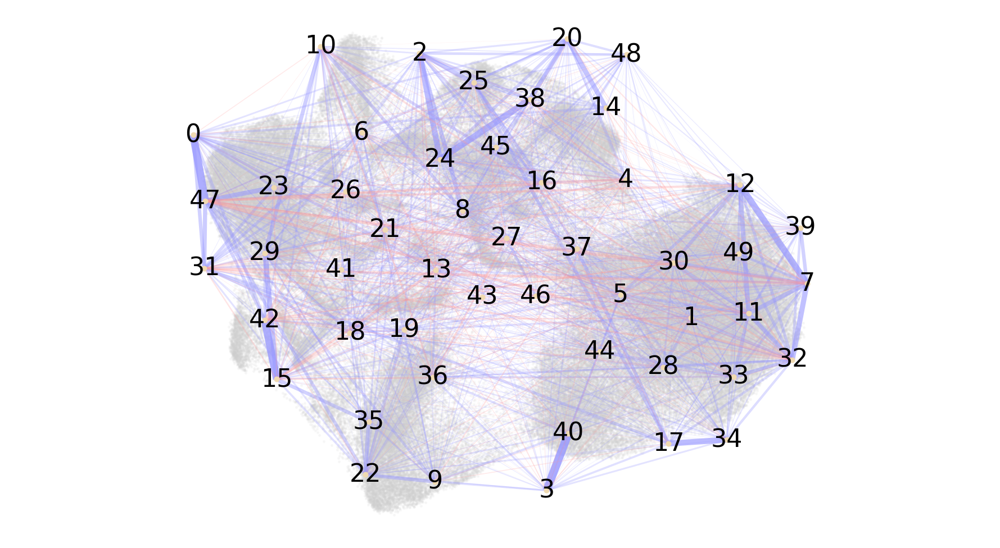

In [94]:
from util.plotting import visualize_network

pos = {ii: program_umap_pos[ii, :] for ii in range(num_spin)}
plt.figure(figsize=[14, 14])
plt.scatter(cadata.obsm['X_umap'][:, 0], cadata.obsm['X_umap'][:, 1], s=2, c='#cccccc', alpha=0.1)
visualize_network(j_mat / 1.5, pos, label={ii: str(ii) for ii in range(num_spin)});
plt.gca().set_aspect('equal', 'box')

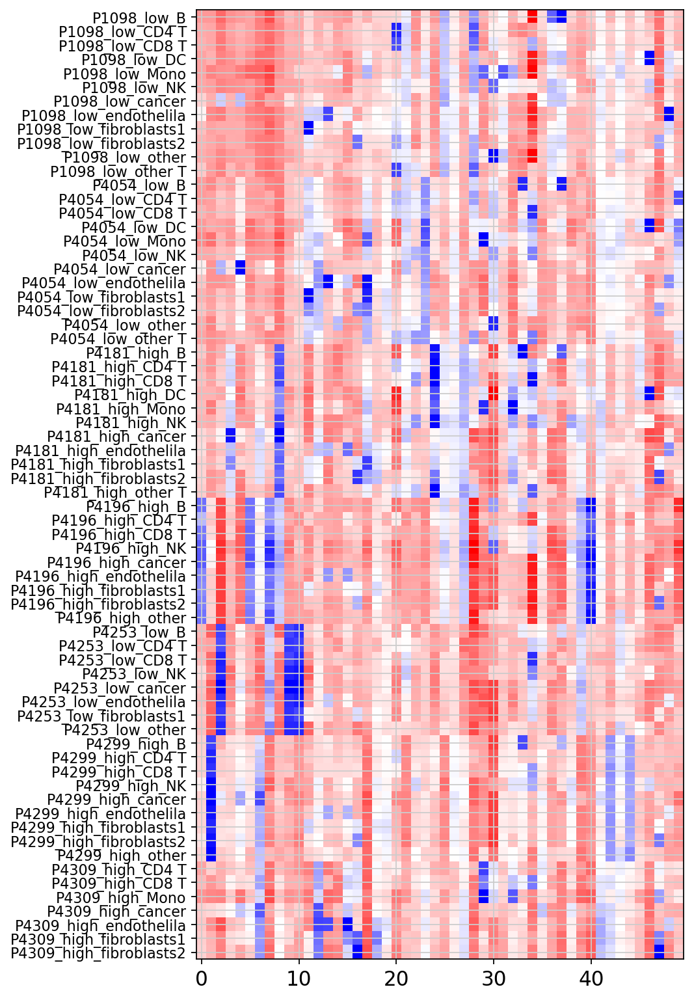

In [97]:
plt.figure(figsize=[6, 12])

plt.imshow(cur_h[spin_order, :].T, cmap='bwr_r', vmin=- 4, vmax=4, aspect='auto')
plt.yticks(np.arange(num_sample), samp_list, fontsize=10);

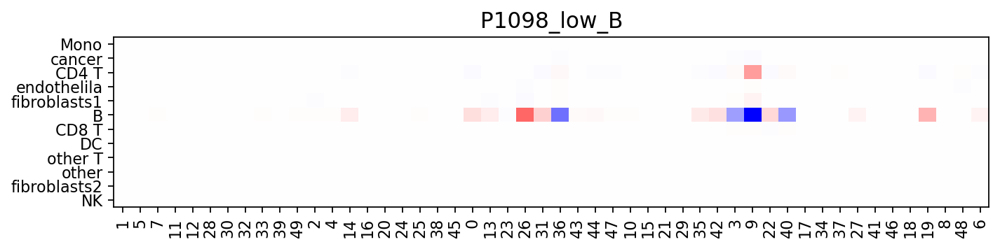

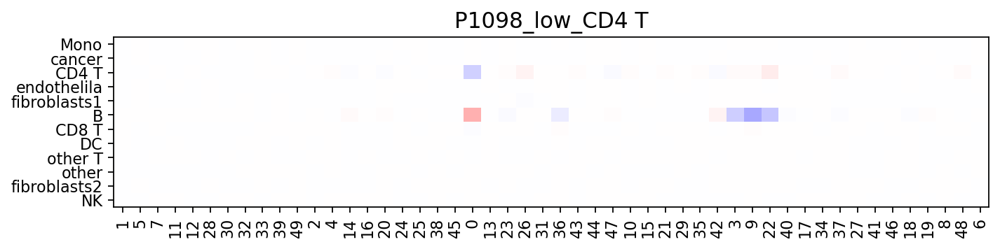

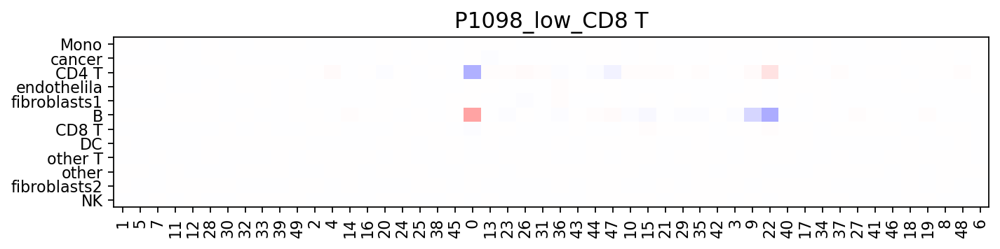

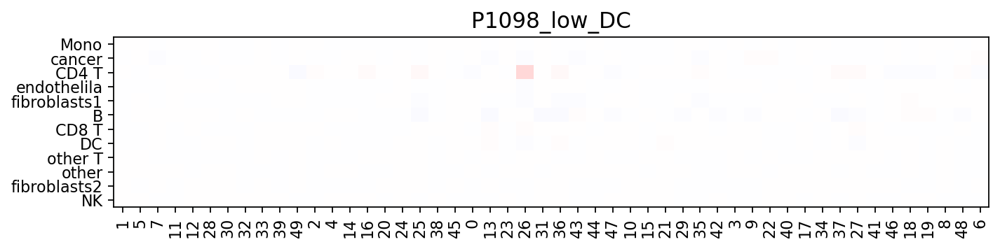

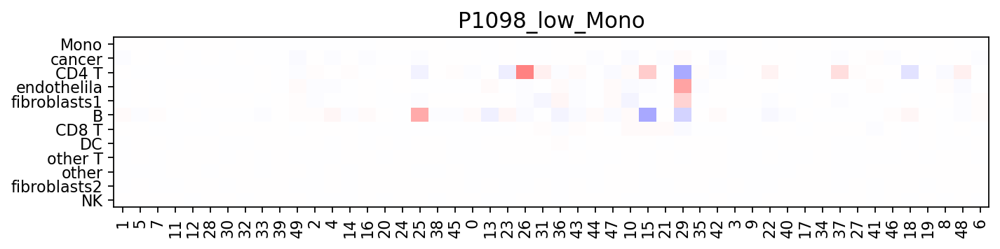

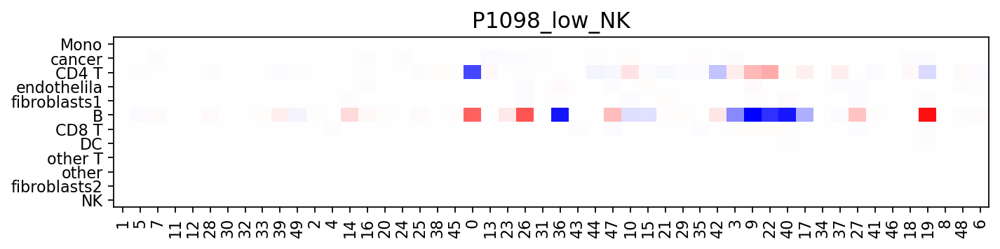

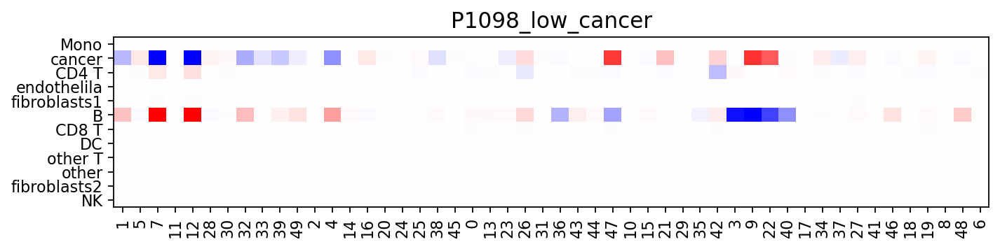

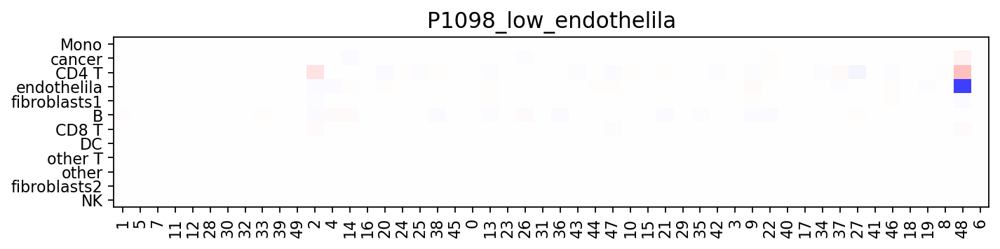

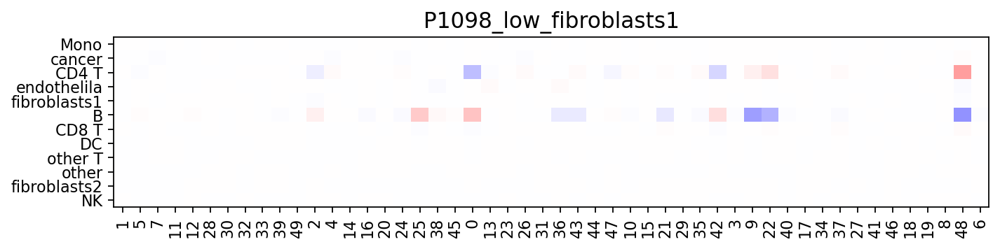

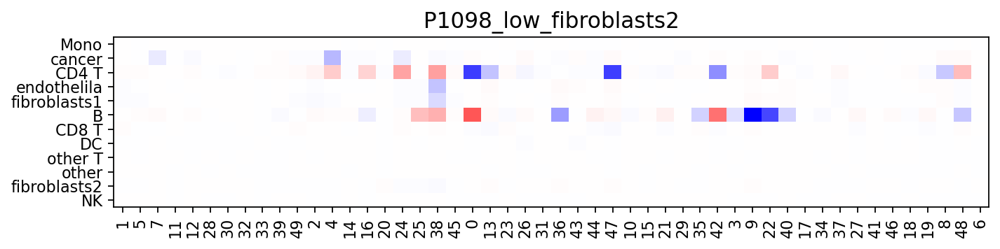

In [98]:
sc.set_figure_params(figsize=[10, 2])

for ii in range(len(samp_list[: 10])):
    plt.figure()
    plt.imshow(neighbor_project[:, :, ii][spin_order, :].T, cmap='bwr_r', vmin=- 2, vmax=2, aspect='auto')
    plt.title(samp_list[ii])
    plt.yticks(np.arange(len(celltype_list)), celltype_list, fontsize=10)
    plt.xticks(np.arange(len(spin_order)), spin_order, fontsize=10, rotation=90)
    plt.grid()
    plt.show()
